<a href="https://colab.research.google.com/github/Domi1808/dominik/blob/main/RSFM_Practical_AI4EO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Download the models
from huggingface_hub import hf_hub_download
hf_hub_download(repo_id="kshitijrajsharma/ai4eo", filename="rsfm_practical.zip", repo_type="dataset", local_dir=".")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


rsfm_practical.zip:   0%|          | 0.00/3.38G [00:00<?, ?B/s]

'rsfm_practical.zip'

In [ ]:
# Extract the models
!unzip rsfm_practical.zip

Archive:  rsfm_practical.zip
   creating: IEEE_TPAMI_SpectralGPT/
  inflating: IEEE_TPAMI_SpectralGPT/engine_finetune.py  
  inflating: IEEE_TPAMI_SpectralGPT/requirements.txt  
  inflating: IEEE_TPAMI_SpectralGPT/engine_finetune_BE.py  
  inflating: IEEE_TPAMI_SpectralGPT/models_mae.py  
   creating: IEEE_TPAMI_SpectralGPT/util/
  inflating: IEEE_TPAMI_SpectralGPT/util/pos_embed.py  
  inflating: IEEE_TPAMI_SpectralGPT/util/logging.py  
  inflating: IEEE_TPAMI_SpectralGPT/util/datasets.py  
  inflating: IEEE_TPAMI_SpectralGPT/util/lars.py  
  inflating: IEEE_TPAMI_SpectralGPT/util/lr_decay.py  
  inflating: IEEE_TPAMI_SpectralGPT/util/crop.py  
  inflating: IEEE_TPAMI_SpectralGPT/util/my_dataset.py  
  inflating: IEEE_TPAMI_SpectralGPT/util/naip_loader.py  
  inflating: IEEE_TPAMI_SpectralGPT/util/video_vit.py  
   creating: IEEE_TPAMI_SpectralGPT/util/__pycache__/
  inflating: IEEE_TPAMI_SpectralGPT/util/__pycache__/misc.cpython-38.pyc  
  inflating: IEEE_TPAMI_SpectralGPT/util/__pyc

In [ ]:
# Reorganize folder
!rm -rf sample_data
!mkdir pretrained_models
!mv *.pth pretrained_models
!mkdir src
!mv IEEE_TPAMI_SpectralGPT src
!mv SkySense src
!mv spectral_gpt.py src
!rm rsfm_practical.zip

In [ ]:
# Download the dataset
import os

if not os.path.exists("sen1floods11_v1.1"):
    hf_hub_download(repo_id="pierreadorni/ai4eospringschool", filename="sen1floods11_v1.1.tar.gz", repo_type="dataset", local_dir=".")
    !tar -xzf sen1floods11_v1.1.tar.gz
    !rm sen1floods11_v1.1.tar.gz
else:
    print("Dataset already exists, skipping download.")

sen1floods11_v1.1.tar.gz:   0%|          | 0.00/1.77G [00:00<?, ?B/s]

In [ ]:
# Allow imports for spectralgpt
!echo "from spectral_gpt import *" > src/__init__.py

In [ ]:
# Install requirements
!pip install -r requirements.txt

Looking in links: https://download.openmmlab.com/mmcv/dist/cu121/torch2.4/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 592.4/592.4 kB 49.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 859.3/859.3 kB 62.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 853.6/853.6 kB 61.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.7/452.7 kB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 89.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 71.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Imports
from torch.utils.data import Dataset
import os
import pandas as pd
import geopandas
import tqdm
import torch
import rasterio
import concurrent
import numpy as np
import torchvision
from matplotlib import pyplot as plt
from torch import jit
import gc

You should restart the kernel here to load the specific numpy version needed to run the notebook !

# Dataset Definition

In [ ]:
# @title
# Dataset Definition
class Sen1Floods11(Dataset):
    def __init__(
        self,
        split: str,
        root_path: str,
        crop_size: int = None,
    ):
        """Initialize the Sen1Floods11 dataset.
        Link: https://github.com/cloudtostreet/Sen1Floods11

        Args:
            split (str): split of the dataset (train, val, test).
            root_path (str): root path of the dataset.
            crop_size (int | None): if given, a random square crop of this
                size is extracted from each sample (applied to all modalities
                and the target identically).  When None the full image is
                returned (512 × 512 for the hand-labeled split).
        """

        self.root_path = root_path
        self.split = split
        self.crop_size = crop_size

        self.distribution = [0.905, 0.095]

        self.split_mapping = {"train": "train", "val": "valid", "test": "test"}

        split_file = os.path.join(
            self.root_path,
            f"splits/flood_{self.split_mapping[split]}_data.txt",
        )
        metadata_file = os.path.join(
            self.root_path, "Sen1Floods11_Metadata.geojson"
        )
        data_root = os.path.join(
            self.root_path, "data/"
        )

        self.metadata = geopandas.read_file(metadata_file)

        with open(split_file) as f:
            file_list = f.readlines()

        file_list = [f.strip() for f in file_list]

        self.s1_image_list = [
            os.path.join(data_root, "S1GRDHand", f+"_S1Hand.tif") for f in file_list
        ]
        self.s2_image_list = [
            os.path.join(data_root, "S2L1CHand", f+"_S2Hand.tif")
            for f in file_list
        ]
        self.target_list = [
            os.path.join(data_root, "LabelHand", f+"_LabelHand.tif") for f in file_list
        ]

    def __len__(self):
        return len(self.s1_image_list)

    def _get_date(self, index):
        file_name = self.s2_image_list[index]
        location = os.path.basename(file_name).split("_")[0]
        if self.metadata[self.metadata["location"] == location].shape[0] != 1:
            date = pd.to_datetime("13-10-1998", dayfirst=True)
        else:
            date = pd.to_datetime(
                self.metadata[self.metadata["location"] == location]["s2_date"].item()
            )
        date_np = np.zeros((1, 3))
        date_np[0, 0] = date.year
        date_np[0, 1] = date.dayofyear - 1  # base 0
        date_np[0, 2] = date.hour
        return date_np

    def __getitem__(self, index):
        with rasterio.open(self.s2_image_list[index]) as src:
            s2_image = src.read()

        with rasterio.open(self.s1_image_list[index]) as src:
            s1_image = src.read()
            # Convert the missing values (clouds etc.)
            s1_image = np.nan_to_num(s1_image)

        with rasterio.open(self.target_list[index]) as src:
            target = src.read(1)

        timestamp = self._get_date(index)

        s2_image = torch.from_numpy(s2_image).float()
        s1_image = torch.from_numpy(s1_image).float()
        target = torch.from_numpy(target).float()


        # resize all to 256x256 (for faster training, and to fit the pretrained weights)
        s2_image = torchvision.transforms.Resize((256, 256))(s2_image)
        s1_image = torchvision.transforms.Resize((256, 256))(s1_image)
        target   = torchvision.transforms.Resize((256, 256), interpolation=torchvision.transforms.InterpolationMode.NEAREST)(target.unsqueeze(0)).squeeze(0)

        mean_s2 = [1626.91600224,1396.03470631,1364.06118417,1218.22847919,1466.07290663,2386.90297537,2845.61256277,2622.95796892,3077.48221481,486.87436782,63.77861008,2030.64763024,1179.16607221]
        std_s2 = [700.17133846,739.09452682,735.2482388,864.936695,776.8803358,921.36834309,1084.37346097,1022.63418007,1196.44255318,336.61105431,143.99923282,980.87061347,764.60836557]
        mean_s1 = [-10.184408, -16.895273]
        std_s1 = [4.255339 , 5.290568]

        s2_image = torchvision.transforms.Normalize(mean_s2, std_s2)(s2_image)
        s1_image = torchvision.transforms.Normalize(mean_s1, std_s1)(s1_image)

        # ── Paired random crop (training augmentation) ───────────────────
        if self.crop_size is not None:
            _, H, W = s2_image.shape
            ti = torch.randint(0, max(1, H - self.crop_size + 1), (1,)).item()
            tj = torch.randint(0, max(1, W - self.crop_size + 1), (1,)).item()
            s2_image = s2_image[:, ti:ti + self.crop_size, tj:tj + self.crop_size]
            s1_image = s1_image[:, ti:ti + self.crop_size, tj:tj + self.crop_size]
            target   = target[ti:ti + self.crop_size, tj:tj + self.crop_size]

        output = {
            "image": {
                "optical": s2_image,
                "sar": s1_image,
            },
            "target": target,
            "metadata": {
                "timestamp": timestamp,
            },
        }

        return output


In [ ]:
# Dataset Instantiation
dataset = Sen1Floods11(
    "train",
    "./sen1floods11_v1.1",
  )

Text(0.5, 1.0, 'Target Label')

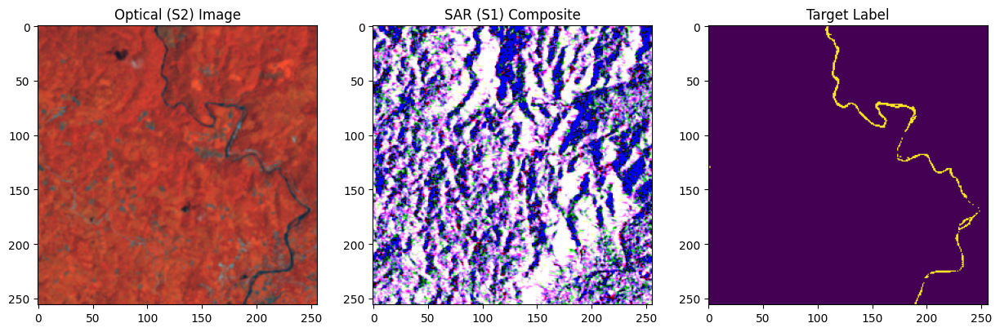

In [ ]:
# Visualize a sample
image_s2 = dataset[55]['image']['optical'].permute(1,2,0)[:,:,[8,4,3]]
image_s2 = image_s2 - image_s2.min()
image_s2 = image_s2 / image_s2.max()

image_s1_raw = dataset[55]['image']['sar']

# Create a 3rd band that is VV/VH
vv_band = image_s1_raw[0, :, :]
vh_band = image_s1_raw[1, :, :]
vv_vh_ratio = vv_band / (vh_band + 1e-6) # Add epsilon to avoid division by zero

image_s1_composite = torch.stack([vv_band, vh_band, vv_vh_ratio], dim=0)

# Permute dimensions for matplotlib (Height, Width, Channels)
image_s1_display = image_s1_composite.permute(1, 2, 0)

target = dataset[55]['target']

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image_s2)
ax[1].imshow(image_s1_display)
ax[2].imshow(target)

ax[0].set_title('Optical (S2) Image')
ax[1].set_title('SAR (S1) Composite')
ax[2].set_title('Target Label')

In [ ]:
# Explore the dataset and find interesting samples to visualize, e.g. samples with different flood extents, clouds etc.
VIS_INDICES = [26, 61] # replace with the indices of 2 interesting samples you find in the dataset

In [ ]:
# Create DataLoader
from torch.utils.data import DataLoader

batch_size = 8
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# UNet Definition

In [ ]:
# @title
# UNet Definition
import torch
import torch.nn as nn
import torch.nn.functional as F

class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, width_multiplier=1, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear
        # UNet has no fixed input size — it works at any resolution,
        # so we use the full image directly (no tiling needed).
        self.img_size = None

        width_pyramid = (np.array([64, 128, 256, 512, 1024]) * width_multiplier).astype(np.int16)

        self.inc = DoubleConv(n_channels, width_pyramid[0])
        self.down1 = Down(width_pyramid[0], width_pyramid[1])
        self.down2 = Down(width_pyramid[1], width_pyramid[2])
        self.down3 = Down(width_pyramid[2], width_pyramid[3])
        self.down4 = Down(width_pyramid[3], width_pyramid[3])
        self.up1 = Up(width_pyramid[4], width_pyramid[2], bilinear)
        self.up2 = Up(width_pyramid[3], width_pyramid[1], bilinear)
        self.up3 = Up(width_pyramid[2], width_pyramid[0], bilinear)
        self.up4 = Up(width_pyramid[1], width_pyramid[0], bilinear)
        self.outc = OutConv(width_pyramid[0], n_classes)

    def forward(self, x):
        # Accept either a dict {"optical": ..., "sar": ...} or a plain tensor.
        # When a dict is provided, S2 (optical) and S1 (SAR) are concatenated
        # along the channel dimension so the network sees all modalities.
        if isinstance(x, dict):
            tensors = [x["optical"]]
            if "sar" in x:
                tensors.append(x["sar"])
            x = torch.cat(tensors, dim=1)

        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits


def number_of_parameters(model):
    """Count the number of trainable parameters in a PyTorch model."""
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total     = sum(p.numel() for p in model.parameters())
    return f"Trainable: {trainable:,} / {total:,} ({100*trainable/total:.1f}%)"

Here's an example of how to instantiate the U-Net and pass some dummy data through it to verify its shape:

In [ ]:
# instantiation and analysis of UNet model
n_channels = 15  # 13 S2 optical bands + 2 S1 SAR bands (VV + VH)
n_classes = 2    # Number of output classes (e.g., flood/no-flood)

unet_model = UNet(n_channels=n_channels, n_classes=n_classes, width_multiplier=0.25)

print(number_of_parameters(unet_model))

dummy_optical = torch.randn(1, 13, 256, 256)
dummy_sar     = torch.randn(1, 2, 256, 256)
output = unet_model({"optical": dummy_optical, "sar": dummy_sar})
print(f"model output shape: {output.shape}")

Trainable: 841,522 / 841,522 (100.0%)
model output shape: torch.Size([1, 2, 256, 256])


# Training loop

In [ ]:
# @title
# definition of loss function and training loop
import torch.optim as optim
import tqdm

def _compute_epoch_miou(model, dataloader, device):
    """Compute mIoU over the full dataloader (no gradient)."""
    model.eval()
    inter_sum = [0.0, 0.0]
    union_sum = [0.0, 0.0]
    with torch.no_grad():
        for data in dataloader:
            image_data = {k: v.to(device) for k, v in data["image"].items()}
            targets = data["target"].long().to(device)
            outputs = model(image_data)

            if targets.shape[-2:] != outputs.shape[-2:]:
                targets = F.interpolate(
                    targets.unsqueeze(1).float(),
                    size=outputs.shape[-2:],
                    mode="nearest",
                ).squeeze(1).long()

            preds = torch.argmax(outputs, dim=1)
            valid_mask = targets != -1
            preds_v = preds[valid_mask]
            targets_v = targets[valid_mask]

            for cls in range(2):
                inter_sum[cls] += ((preds_v == cls) & (targets_v == cls)).sum().item()
                union_sum[cls] += ((preds_v == cls) | (targets_v == cls)).sum().item()

    ious = [
        inter_sum[cls] / (union_sum[cls] + 1e-6) if union_sum[cls] > 0 else 1.0
        for cls in range(2)
    ]
    model.train()
    return float(np.mean(ious))

# definition of training loop
def train_model_on_sen1floods11(model, n_epochs=1, balance_classes=False, log_interval=10):
    # Use model native crop size if valid int, else fallback to full image size (256)
    model_img_size = getattr(model, "img_size", None)
    use_native_crop = isinstance(model_img_size, int) and model_img_size > 0
    crop_size = model_img_size if use_native_crop else 256  # always int for type checker

    train_ds = Sen1Floods11("train", "./sen1floods11_v1.1", crop_size=crop_size)
    train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2)

    if use_native_crop:
        print(f"Training with random {crop_size}×{crop_size} crops (model native resolution). Evaluation uses tiled inference.")
    else:
        print("Training on full 256x256 images (UNet — no fixed resolution).")

    class_distribution = train_ds.distribution
    print(f"Class Distribution: {class_distribution}")

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    # criterion = DiceLoss(ignore_index=-1)
    criterion = torch.nn.CrossEntropyLoss(ignore_index=-1)

    model = model.to(device)
    miou_history = []

    print(f"Starting training on {device}...")

    miou_epoch0 = _compute_epoch_miou(model, train_dl, device)
    miou_history.append((0, miou_epoch0))
    print(f"Epoch 0 (before training) — mIoU: {miou_epoch0*100:.2f}%")

    model.train()
    for epoch in range(n_epochs):
        running_loss = 0.0

        # Reduce LR once at halfway point
        if n_epochs > 1 and epoch == (n_epochs // 2):
            for param_group in optimizer.param_groups:
                old_lr = param_group["lr"]
                param_group["lr"] = old_lr / 10.0
            print(f"Epoch {epoch+1}: reducing learning rate to {optimizer.param_groups[0]['lr']:.1e}")


        inter_sum = [0.0, 0.0]
        union_sum = [0.0, 0.0]
        with tqdm.tqdm(enumerate(train_dl), total=len(train_dl), desc=f"Epoch {epoch+1}") as pbar:
            for i, data in pbar:
                image_data = {k: v.to(device) for k, v in data["image"].items()}
                targets = data["target"].long().to(device)

                optimizer.zero_grad()
                outputs = model(image_data)

                if outputs.ndim != 4:
                    raise ValueError(f"Expected model outputs with 4 dims [B,C,H,W], got {outputs.shape}")

                if targets.shape[-2:] != outputs.shape[-2:]:
                    targets = F.interpolate(
                        targets.unsqueeze(1).float(),
                        size=outputs.shape[-2:],
                        mode="nearest",
                    ).squeeze(1).long()


                preds = torch.argmax(outputs, dim=1)
                valid_mask = targets != -1
                preds_v = preds[valid_mask]
                targets_v = targets[valid_mask]

                for cls in range(2):
                    inter_sum[cls] += ((preds_v == cls) & (targets_v == cls)).sum().item()
                    union_sum[cls] += ((preds_v == cls) | (targets_v == cls)).sum().item()

                loss = criterion(outputs, targets)
                loss.backward()
                optimizer.step()

                running_loss += loss.item()

                if log_interval > 0 and (i + 1) % log_interval == 0:
                    avg_loss = running_loss / log_interval
                    pbar.set_postfix({"loss": f"{avg_loss:.4f}"})
                    running_loss = 0.0

        ious = [
          inter_sum[cls] / (union_sum[cls] + 1e-6) if union_sum[cls] > 0 else 1.0
          for cls in range(2)
        ]

        # miou_epoch = _compute_epoch_miou(model, train_dl, device)
        miou_epoch = float(np.mean(ious))
        miou_history.append((epoch + 1, miou_epoch))
        print(f"Epoch {epoch+1} — mIoU: {miou_epoch*100:.2f}%")

    return miou_history

In [ ]:
# train on unet
unet_history = train_model_on_sen1floods11(unet_model, n_epochs=6)

Training on full 256x256 images (UNet — no fixed resolution).
Class Distribution: [0.905, 0.095]
Starting training on cuda...
Epoch 0 (before training) — mIoU: 9.32%


Epoch 1: 100%|██████████| 32/32 [00:14<00:00,  2.26it/s, loss=0.7219]

Epoch 1 — mIoU: 19.75%



Epoch 2: 100%|██████████| 32/32 [00:12<00:00,  2.54it/s, loss=0.6104]

Epoch 2 — mIoU: 41.00%



Epoch 3: 100%|██████████| 32/32 [00:12<00:00,  2.56it/s, loss=0.5565]

Epoch 3 — mIoU: 52.42%
Epoch 4: reducing learning rate to 1.0e-05



Epoch 4: 100%|██████████| 32/32 [00:14<00:00,  2.15it/s, loss=0.5383]

Epoch 4 — mIoU: 57.19%



Epoch 5: 100%|██████████| 32/32 [00:12<00:00,  2.59it/s, loss=0.5247]

Epoch 5 — mIoU: 58.68%



Epoch 6: 100%|██████████| 32/32 [00:12<00:00,  2.56it/s, loss=0.5383]

Epoch 6 — mIoU: 58.34%


The `unet_history` variable contains the mIoU values across training epochs, it will be useful to us later on for plotting the results.

# Inference & Evaluation code

Two fixed validation samples chosen for visual interest: this is where
your `VIS_INDICES = [00, 00]` will be used

In [ ]:
# @title
# Inference & Evaluation code

# Two fixed validation samples chosen for visual interest: this is where
# your VIS_INDICES = [00, 00] will be useful

# inference on small tiled images
def tiled_inference(model, image_dict, tile_size, stride=None, num_classes=2):
    """Sliding-window tiled inference with overlap averaging.

    Splits every modality tensor in ``image_dict`` into square tiles of
    ``tile_size``, runs the model on each tile-dict, and reconstructs the
    full-resolution logit map by averaging overlapping predictions.

    Args:
        model:        PyTorch model called as ``model(tile_dict) → (B, C, ts, ts)``.
        image_dict:   dict mapping modality name → ``(B, bands, H, W)`` tensor.
        tile_size:    Square tile side length in pixels.
        stride:       Step between tiles. Defaults to ``tile_size // 2``.
        num_classes:  Number of output channels.

    Returns:
        Averaged logits of shape ``(B, num_classes, H, W)``.
    """
    if stride is None:
        stride = tile_size // 2

    # Use optical (or first modality) as reference for spatial dims
    ref = image_dict.get("optical", next(iter(image_dict.values())))
    B, _, H, W = ref.shape
    device = ref.device

    logits_sum = torch.zeros(B, num_classes, H, W, device=device)
    count_map  = torch.zeros(B, 1,           H, W, device=device)

    def _starts(length):
        """Tile start positions that cover [0, length - tile_size] fully."""
        pts = list(range(0, max(1, length - tile_size), stride))
        pts.append(length - tile_size)
        return sorted(set(max(0, p) for p in pts))

    model.eval()
    with torch.no_grad():
        for yi in _starts(H):
            for xi in _starts(W):
                tile_dict = {
                    k: v[:, :, yi:yi + tile_size, xi:xi + tile_size]
                    for k, v in image_dict.items()
                }
                tile_out = model(tile_dict)   # (B, num_classes, tile_size, tile_size)
                logits_sum[:, :, yi:yi + tile_size, xi:xi + tile_size] += tile_out
                count_map [:, :, yi:yi + tile_size, xi:xi + tile_size] += 1.0

    return logits_sum / count_map.clamp(min=1e-6)

# inference on large image (manage the tiling process)
def evaluate_model(model, dataloader, device):
    """Evaluates the model on the given dataloader and returns average IoU.

    Uses tiled inference when the model exposes an ``img_size`` attribute
    (RSFM backbones with a fixed native resolution), otherwise runs a direct
    forward pass on the full image (e.g. UNet).
    """
    model.eval()
    total_iou   = 0.0
    num_batches = 0
    epsilon     = 1e-6
    tile_size   = getattr(model, "img_size", None)

    with torch.no_grad():
        for data in dataloader:
            image_data = {k: v.to(device) for k, v in data["image"].items()}
            targets    = data["target"].to(device)

            if tile_size is not None:
                outputs = tiled_inference(model, image_data, tile_size)
            else:
                outputs = model(image_data)

            predictions = torch.argmax(outputs, dim=1)

            valid_pixels_mask      = targets != -1
            targets_flat_valid     = targets[valid_pixels_mask]
            predictions_flat_valid = predictions[valid_pixels_mask]

            if targets_flat_valid.numel() > 0:
                intersection = ((predictions_flat_valid == 1) & (targets_flat_valid == 1)).sum().item()
                union        = ((predictions_flat_valid == 1) | (targets_flat_valid == 1)).sum().item()

                if union == 0:
                    iou_batch = 1.0 if intersection == 0 else 0.0
                else:
                    iou_batch = intersection / (union + epsilon)

                total_iou  += iou_batch
                num_batches += 1

    return total_iou / num_batches if num_batches > 0 else 0.0


def plot_prediction_examples(model, dataset, device, indices=None):
    """Plots prediction examples for fixed (or given) dataset indices.

    Uses tiled inference when the model exposes an ``img_size`` attribute.
    """
    model.eval()

    if indices is None:
        indices = VIS_INDICES

    tile_size    = getattr(model, "img_size", None)
    num_examples = len(indices)
    fig, axes    = plt.subplots(num_examples, 4, figsize=(18, 5 * num_examples))
    if num_examples == 1:
        axes = [axes]
    fig.suptitle('Model Predictions vs. Ground Truth', fontsize=16)

    for i, idx in enumerate(indices):
        data = dataset[idx]

        # Prepare S2 image for display
        image_s2 = data['image']['optical'].permute(1,2,0)[:,:,[8,4,3]]
        image_s2 = image_s2 - image_s2.min()
        image_s2 = image_s2 / image_s2.max()

        # Prepare S1 composite for display (VV, VH, VV/VH ratio)
        image_s1_raw   = data['image']['sar']
        vv_band        = image_s1_raw[0, :, :]
        vh_band        = image_s1_raw[1, :, :]
        vv_vh_ratio    = vv_band / (vh_band + 1e-6)
        image_s1_composite = torch.stack([vv_band, vh_band, vv_vh_ratio], dim=0)

        # 1% – 99% percentile normalisation for better visualisation
        image_s1_display = image_s1_composite.clone()
        for c in range(image_s1_composite.shape[0]):
            channel = image_s1_composite[c]
            p1  = torch.quantile(channel, 0.01)
            p99 = torch.quantile(channel, 0.99)
            image_s1_display[c] = torch.clamp((channel - p1) / (p99 - p1 + 1e-6), 0, 1)
        image_s1_display = image_s1_display.permute(1, 2, 0)

        target      = data['target']
        image_input = {k: v.unsqueeze(0).to(device) for k, v in data['image'].items()}

        if tile_size is not None:
            print(f"Running tiled inference for sample {idx} with tile size {tile_size}...")
            outputs = tiled_inference(model, image_input, tile_size)
        else:
            with torch.no_grad():
                outputs = model(image_input)

        prediction = torch.argmax(outputs, dim=1).squeeze(0)

        axes[i][0].imshow(image_s2.cpu().numpy())
        axes[i][0].set_title(f'Sample {idx} S2 Optical')
        axes[i][0].axis('off')

        axes[i][1].imshow(image_s1_display.cpu().numpy())
        axes[i][1].set_title(f'Sample {idx} S1 SAR')
        axes[i][1].axis('off')

        axes[i][2].imshow(target.cpu().numpy(), cmap='gray')
        axes[i][2].set_title(f'Sample {idx} Ground Truth')
        axes[i][2].axis('off')

        axes[i][3].imshow(prediction.cpu().numpy(), cmap='gray')
        axes[i][3].set_title(f'Sample {idx} Prediction')
        axes[i][3].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Validation



Validation IoU (Flood Class): 0.4498


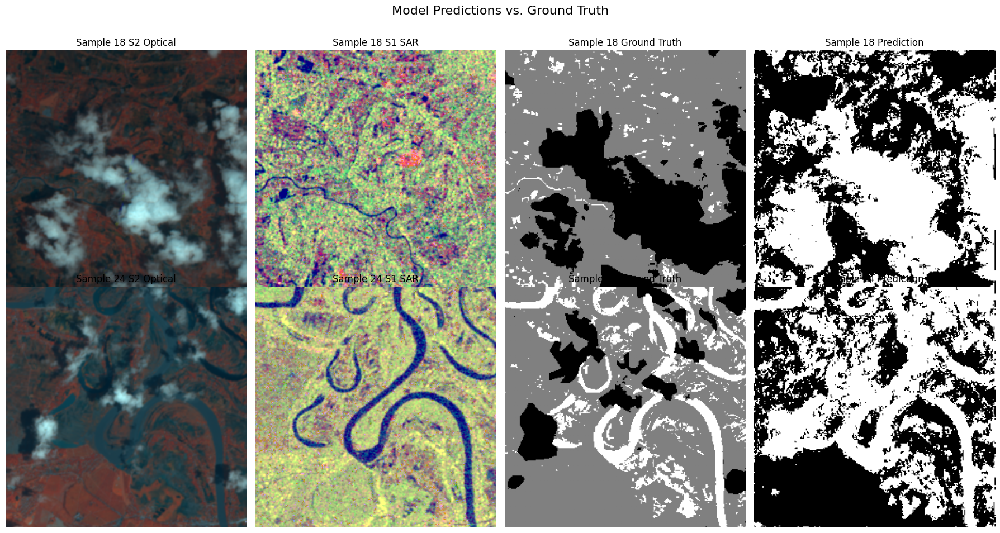

In [ ]:
# val dataset & dataloader creation
val_dataset = Sen1Floods11(
    "val",
    "./sen1floods11_v1.1",
  )
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False) # No need to shuffle validation data

val_iou = evaluate_model(unet_model, val_dataloader, "cuda")
print(f"Validation IoU (Flood Class): {val_iou:.4f}")

# infer and plot
plot_prediction_examples(unet_model, val_dataset, "cuda", indices=[18,24])

In [ ]:
# Purge the VRAM
del unet_model
gc.collect()
torch.cuda.empty_cache()
print(f"UNet deleted. allocated VRAM : {torch.cuda.memory_allocated()/1e9:.2f} GB")

# Now With RSFMs !

We will use multiple Remote Sensing foundation models to perform the same task, and compare the results

## Definition of the UperNet decoder with a learned pyramidal neck to handle the 4 distinct ViT feature maps as input.


In [ ]:
# @title
# Definition of the UperNet decoder with a learned pyramidal neck to handle the 4 distinct ViT feature maps as input.
# ============================================================
# Shared decoder — used by ALL RSFM wrappers below
# ============================================================
import torch
import torch.nn as nn
import torch.nn.functional as F
from terratorch.models.decoders.upernet_decoder import UperNetDecoder as TerraUperNet


class LearnedToPyramidalNeck(nn.Module):
    """Build a true 4-level spatial pyramid from 4 semantically distinct ViT maps."""

    def __init__(self, in_channels: int):
        super().__init__()
        channels = in_channels
        self.fpn1 = nn.Sequential(
            nn.ConvTranspose2d(channels, channels // 2, kernel_size=2, stride=2),
            nn.BatchNorm2d(channels // 2),
            nn.GELU(),
            nn.ConvTranspose2d(channels // 2, channels // 4, kernel_size=2, stride=2),
        )
        self.fpn2 = nn.Sequential(
            nn.ConvTranspose2d(channels, channels // 2, kernel_size=2, stride=2),
        )
        self.fpn3 = nn.Identity()
        self.fpn4 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.out_channels = [channels // 4, channels // 2, channels, channels]

    def forward(self, features: list[torch.Tensor]) -> list[torch.Tensor]:
        return [
            self.fpn1(features[0]),
            self.fpn2(features[1]),
            self.fpn3(features[2]),
            self.fpn4(features[3]),
        ]


class MultiScaleUperNetHead(nn.Module):
    """Shared segmentation head for all RSFM backbones."""

    def __init__(self, in_channels: int, num_classes: int = 2, channels: int = 256):
        super().__init__()
        self.neck = LearnedToPyramidalNeck(in_channels)
        self.decoder = TerraUperNet(
            embed_dim=self.neck.out_channels,
            channels=channels,
            pool_scales=(2, 3, 6),
        )
        self.cls_seg = nn.Conv2d(channels, num_classes, kernel_size=1)

    def forward(self, features: list[torch.Tensor]) -> torch.Tensor:
        pyramid = self.neck(features)
        decoded = self.decoder(pyramid)
        return self.cls_seg(decoded)

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [ ]:
# Sanity checks
with torch.no_grad():
    _head_768 = MultiScaleUperNetHead(768).eval()
    _out_768 = _head_768([torch.zeros(1, 768, 16, 16) for _ in range(4)])
    assert _out_768.shape == (1, 2, 64, 64), f"768 shape mismatch: {_out_768.shape}"

    _head_1024 = MultiScaleUperNetHead(1024).eval()
    _out_1024 = _head_1024([torch.zeros(1, 1024, 16, 16) for _ in range(4)])
    assert _out_1024.shape == (1, 2, 64, 64), f"1024 shape mismatch: {_out_1024.shape}"

    del _head_768, _out_768, _head_1024, _out_1024

print("MultiScaleUperNetHead OK")

MultiScaleUperNetHead OK



## TerraMind

**TerraMind** is a symmetric transformer-based encoder-decoder foundation model for Earth Observation,
developed jointly by IBM Research, ESA Φ-lab, Jülich Supercomputing Centre, and the FAST-EO project.
It was pre-trained on **TerraMesh**, the largest multimodal geospatial dataset to date, comprising
9 million globally-distributed, spatiotemporally aligned samples across nine data modalities —
including Sentinel-1 SAR, Sentinel-2 optical, DEM, LULC, NDVI, RGB, and geographic coordinates.

In [ ]:
# Definition of full segmentation model with TerraMind backbone linked to the UperNet decoder.
import torch
import torch.nn as nn
# Must import to trigger registration with BACKBONE_REGISTRY
from terratorch.models import EncoderDecoderFactory


class TerraMindSegmentation(nn.Module):
    """
    TerraMind backbone + UperNet decoder via EncoderDecoderFactory.
    Processes both Sentinel-2 L1C (optical) and Sentinel-1 GRD (SAR) — two of
    the nine modalities on which TerraMind was pre-trained via TerraMesh.

    - SelectIndices picks 4 evenly-spaced transformer layers
    - ReshapeTokensToImage converts (B, N, C) tokens → (B, C, H, W)
    - merge_method='concat' concatenates both modality feature maps

    Input:  dict {"optical": (B, 13, H, W), "sar": (B, 2, H, W)}
            raw, unnormalized Sentinel-2 L1C + Sentinel-1 GRD values
    Output: (B, 2, H, W)  — flood / no-flood logits

    img_size = 224: training uses 224×224 random crops; validation uses
    tiled inference at 224×224 with 50% overlap on the full 512×512 image.
    """

    def __init__(self, backbone_name="terramind_v1_base", num_classes=2,
                 freeze_encoder=True):
        super().__init__()

        # Native input resolution of the TerraMind ViT (patch_size=16 → 14×14 grid)
        self.img_size = 224

        factory = EncoderDecoderFactory()
        self._model = factory.build_model(
            task="segmentation",
            backbone=backbone_name,
            backbone_kwargs={
                "pretrained": True,
                "modalities": ["S2L1C", "S1GRD"],
                "merge_method": "concat"
            },
            decoder="UperNetDecoder",
            decoder_channels=256,
            necks=[
                # Pick 4 evenly-spaced layers from the 12 transformer blocks
                {"name": "SelectIndices", "indices": [2, 5, 8, 11]},
                # Reshape token sequences (B, N, C) → spatial maps (B, C, H, W)
                {"name": "ReshapeTokensToImage", "remove_cls_token": False},
                {"name": "LearnedInterpolateToPyramidal"}
            ],
            head_dropout=0.1,
            num_classes=num_classes,
            rescale=True,
        )

        if freeze_encoder:
            for p in self._model.encoder.parameters():
                p.requires_grad_(False)

    def forward(self, image_dict: dict) -> torch.Tensor:
        s2 = image_dict["optical"]   # (B, 13, H, W)
        s1 = image_dict["sar"]       # (B, 2, H, W)
        # Pass a modality dict so TerraMind encodes both streams
        return self._model({"S2L1C": s2, "S1GRD": s1}).output


In [ ]:
# model instantiation. IMPORTANT ! use the freeze_encoder flag, do not forget .cuda().
terramind_model = TerraMindSegmentation()

print(number_of_parameters(terramind_model))

# training the model for 6 epochs
terramind_history = train_model_on_sen1floods11(terramind_model, n_epochs=6)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


TerraMind_v1_base.pt:   0%|          | 0.00/1.52G [00:00<?, ?B/s]

Trainable: 22,914,946 / 110,820,226 (20.7%)
Training with random 224×224 crops (model native resolution). Evaluation uses tiled inference.
Class Distribution: [0.905, 0.095]
Starting training on cuda...
Epoch 0 (before training) — mIoU: 17.81%


Epoch 1: 100%|██████████| 32/32 [00:15<00:00,  2.01it/s, loss=0.3531]

Epoch 1 — mIoU: 57.25%



Epoch 2: 100%|██████████| 32/32 [00:15<00:00,  2.06it/s, loss=0.2478]

Epoch 2 — mIoU: 75.42%



Epoch 3: 100%|██████████| 32/32 [00:15<00:00,  2.04it/s, loss=0.1610]

Epoch 3 — mIoU: 77.51%
Epoch 4: reducing learning rate to 1.0e-05



Epoch 4: 100%|██████████| 32/32 [00:15<00:00,  2.07it/s, loss=0.1285]

Epoch 4 — mIoU: 77.61%



Epoch 5: 100%|██████████| 32/32 [00:16<00:00,  1.97it/s, loss=0.1995]

Epoch 5 — mIoU: 78.70%



Epoch 6: 100%|██████████| 32/32 [00:16<00:00,  1.90it/s, loss=0.1365]

Epoch 6 — mIoU: 79.43%


TerraMind IoU: 0.6303
Running tiled inference for sample 26 with tile size 224...
Running tiled inference for sample 61 with tile size 224...


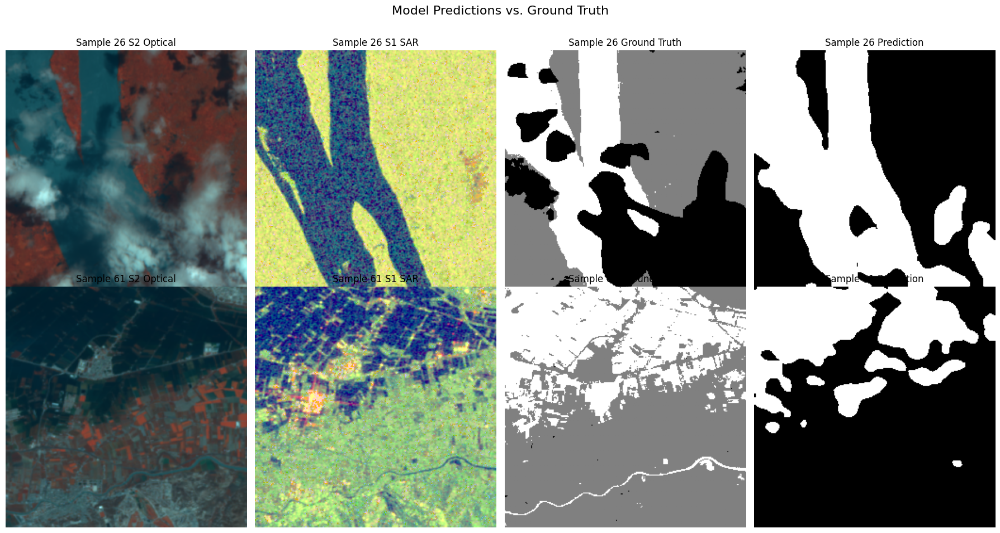

In [ ]:
# Terramind evaluation
terramind_iou = evaluate_model(terramind_model, val_dataloader, "cuda")
print(f"TerraMind IoU: {terramind_iou:.4f}")

plot_prediction_examples(terramind_model, val_dataset, "cuda")

In [ ]:
# Purge the VRAM
import gc
del terramind_model
gc.collect()
torch.cuda.empty_cache()
print(f"TerraMind deleted. allocated VRAM : {torch.cuda.memory_allocated()/1e9:.2f} GB")

## SpectralGPT


In [ ]:
# Definition of the SpectralGPT wrapper with the shared UperNet decoder head.
import sys
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

# Fix the path to include src/ so that spectral_gpt can be found
_src_path = os.path.abspath("./src")
if _src_path not in sys.path:
    sys.path.insert(0, _src_path)

# Now we can import from the file located in src/
from spectral_gpt import load_spectral_gpt


def _spectral_gpt_tokens_to_feature_map(encoder, tokens: torch.Tensor) -> torch.Tensor:
    """Convert flattened SpectralGPT tokens back to a 2-D feature map."""
    batch_size, _, channels = tokens.shape
    num_groups = encoder.patch_embed.t_grid_size
    num_spatial_tokens = encoder.patch_embed.grid_size ** 2
    grid_size = encoder.patch_embed.grid_size
    tokens = tokens.reshape(batch_size, num_groups, num_spatial_tokens, channels).mean(dim=1)
    return tokens.permute(0, 2, 1).reshape(batch_size, channels, grid_size, grid_size)


def _spectral_gpt_multi_scale(encoder, x: torch.Tensor, indices=(2, 5, 8, 11)) -> list[torch.Tensor]:
    """Extract 4 intermediate SpectralGPT feature maps as image grids."""
    batch_size = x.shape[0]
    tokens = encoder.patch_embed(x.unsqueeze(1))

    num_groups = tokens.shape[1]
    num_spatial_tokens = tokens.shape[2]
    channels = tokens.shape[3]
    pos = encoder.pos_embed_spatial.unsqueeze(1).expand(-1, num_groups, -1, -1)
    pos = pos + encoder.pos_embed_temporal.unsqueeze(2).expand(-1, -1, num_spatial_tokens, -1)
    tokens = (tokens + pos).reshape(batch_size, num_groups * num_spatial_tokens, channels)

    features = []
    for block_index, block in enumerate(encoder.blocks):
        tokens = block(tokens)
        if block_index in indices:
            block_tokens = encoder.norm(tokens)
            features.append(_spectral_gpt_tokens_to_feature_map(encoder, block_tokens))

    if len(features) != 4:
        raise RuntimeError(f"Expected 4 feature maps, got {len(features)}")

    return features


class SpectralGPTWrapper(nn.Module):
    """SpectralGPT backbone + shared MultiScale UperNet head.

    SpectralGPT was pre-trained exclusively on Sentinel-2 optical imagery, so
    only the optical modality is used here.  The model accepts the shared image
    dict interface (``{"optical": ..., "sar": ...}``) but ignores the SAR
    bands — they are processed by other multi-modal models in this notebook.
    """

    BAND_INDICES = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12]

    def __init__(self, checkpoint_path: str, num_classes: int = 2):
        super().__init__()
        self.img_size = 128
        self.encoder = load_spectral_gpt(checkpoint_path)
        for parameter in self.encoder.parameters():
            parameter.requires_grad_(False)
        self.encoder.eval()
        self.decoder = MultiScaleUperNetHead(768, num_classes=num_classes)

    def forward(self, x) -> torch.Tensor:
        # Accept dict (shared interface) or plain tensor
        if isinstance(x, dict):
            x = x["optical"]
        height, width = x.shape[-2:]
        x = x[:, self.BAND_INDICES, :, :]
        x = F.interpolate(x, size=(128, 128), mode="bilinear", align_corners=False)
        features = _spectral_gpt_multi_scale(self.encoder, x)
        logits = self.decoder(features)
        if logits.shape[-2:] != (height, width):
            logits = F.interpolate(logits, size=(height, width), mode="bilinear", align_corners=False)
        return logits

/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [ ]:
# instantiate the model. checkpoint is at "pretrained_models/SpectralGPT.pth"
spectral_gpt_model = SpectralGPTWrapper(checkpoint_path="/content/pretrained_models/SpectralGPT.pth")

print(number_of_parameters(spectral_gpt_model))

[SpectralGPT] Loaded from /content/pretrained_models/SpectralGPT.pth
  missing    : []
  unexpected : []
Trainable: 11,263,682 / 96,667,586 (11.7%)


In [ ]:
# train for 6 epochs
spectral_gpt_history = train_model_on_sen1floods11(spectral_gpt_model, n_epochs=6)

Training with random 128×128 crops (model native resolution). Evaluation uses tiled inference.
Class Distribution: [0.905, 0.095]
Starting training on cuda...
Epoch 0 (before training) — mIoU: 4.74%


Epoch 1: 100%|██████████| 32/32 [00:26<00:00,  1.19it/s, loss=0.3695]

Epoch 1 — mIoU: 51.53%



Epoch 2: 100%|██████████| 32/32 [00:29<00:00,  1.07it/s, loss=0.2763]

Epoch 2 — mIoU: 64.09%



Epoch 3: 100%|██████████| 32/32 [00:32<00:00,  1.03s/it, loss=0.2033]

Epoch 3 — mIoU: 66.66%
Epoch 4: reducing learning rate to 1.0e-05



Epoch 4: 100%|██████████| 32/32 [00:29<00:00,  1.08it/s, loss=0.1893]

Epoch 4 — mIoU: 69.28%



Epoch 5: 100%|██████████| 32/32 [00:30<00:00,  1.05it/s, loss=0.1954]

Epoch 5 — mIoU: 69.79%



Epoch 6: 100%|██████████| 32/32 [00:31<00:00,  1.02it/s, loss=0.1803]

Epoch 6 — mIoU: 68.28%


SpectralGPT IoU: 0.4772
Running tiled inference for sample 26 with tile size 128...
Running tiled inference for sample 61 with tile size 128...


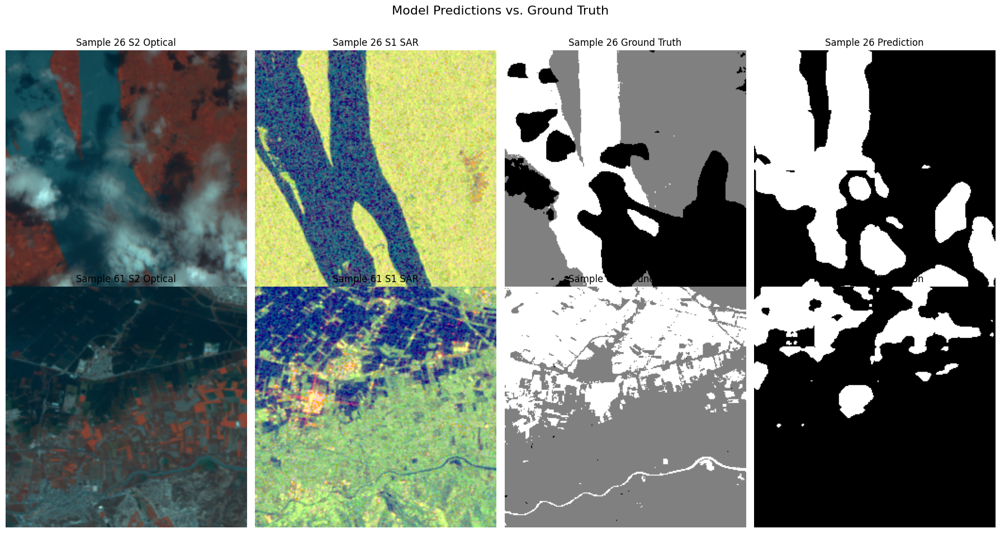

In [ ]:
spectral_gpt_iou = evaluate_model(spectral_gpt_model, val_dataloader, "cuda")
print(f"SpectralGPT IoU: {spectral_gpt_iou:.4f}")

plot_prediction_examples(spectral_gpt_model, val_dataset, "cuda")

In [ ]:
# Purge the VRAM
import gc
del spectral_gpt_model
gc.collect()
torch.cuda.empty_cache()
print(f"SpectralGPT deleted. allocated VRAM : {torch.cuda.memory_allocated()/1e9:.2f} GB")

SpectralGPT deleted. allocated VRAM : 0.56 GB


## DOFA: Dynamic One-For-All Foundation Model

**DOFA** (Neural Plasticity-Inspired Foundation Model) is a unified multimodal foundation model for Earth Observation that handles any number of spectral bands through wavelength-conditioned dynamic token embeddings. Rather than fixed channel convolutions, DOFA uses the physical wavelength of each band to generate adaptive patch embeddings, making it naturally compatible with any sensor configuration. Here we load the pretrained DOFA ViT-Base backbone via TorchGeo (which handles weight download automatically), freeze it, and attach a lightweight ConvTranspose2d decoder for pixel-wise flood segmentation on Sentinel-2 13-band imagery.

In [ ]:
# Definition of the DOFA wrapper with the shared UperNet decoder head.
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchgeo.models import DOFABase16_Weights, dofa_base_patch16_224

S2_WAVELENGTHS_UM = [
    0.443, 0.490, 0.560, 0.665, 0.705,
    0.740, 0.783, 0.842, 0.865, 0.945,
    1.375, 1.610, 2.190,
]


def _dofa_multi_scale(backbone, x: torch.Tensor, wavelengths, indices=(2, 5, 8, 11)) -> list[torch.Tensor]:
    """Extract 4 intermediate DOFA feature maps as image grids."""
    batch_size = x.shape[0]
    wavelength_tensor = torch.tensor(wavelengths, device=x.device).float()
    backbone.waves = wavelength_tensor
    tokens, _ = backbone.patch_embed(x, wavelength_tensor)
    tokens = tokens + backbone.pos_embed[:, 1:, :]
    cls_token = backbone.cls_token + backbone.pos_embed[:, :1, :]
    cls_tokens = cls_token.expand(tokens.shape[0], -1, -1)
    tokens = torch.cat((cls_tokens, tokens), dim=1)

    features = []
    for block_index, block in enumerate(backbone.blocks):
        tokens = block(tokens)
        if block_index in indices:
            patch_tokens = tokens[:, 1:, :]
            grid_size = int(patch_tokens.shape[1] ** 0.5)
            feature_map = patch_tokens.permute(0, 2, 1).reshape(batch_size, -1, grid_size, grid_size)
            features.append(feature_map)

    if len(features) != 4:
        raise RuntimeError(f"Expected 4 feature maps, got {len(features)}")

    return features


class DOFASegmentationModel(nn.Module):
    """DOFA ViT-Base backbone + shared MultiScale UperNet head.

    DOFA uses wavelength-conditioned dynamic token embeddings, making it
    naturally compatible with any optical sensor configuration.  The model
    is pre-trained on multi-sensor optical data; here we use it with Sentinel-2
    13-band imagery only.  The shared image dict interface is supported — SAR
    bands are ignored since DOFA's pre-training did not include SAR data.
    """

    def __init__(self, num_classes: int = 2, freeze_encoder: bool = True):
        super().__init__()
        self.img_size = 224
        self.backbone = dofa_base_patch16_224(weights=DOFABase16_Weights.DOFA_MAE)
        self.embed_dim = 768

        if freeze_encoder:
            for parameter in self.backbone.parameters():
                parameter.requires_grad_(False)
            self.backbone.eval()

        self.decoder = MultiScaleUperNetHead(self.embed_dim, num_classes=num_classes)
        self.wavelengths = S2_WAVELENGTHS_UM

    def forward(self, x) -> torch.Tensor:
        # Accept dict (shared interface) or plain tensor
        if isinstance(x, dict):
            x = x["optical"]
        _, _, height, width = x.shape
        x224 = F.interpolate(x, size=(224, 224), mode="bilinear", align_corners=False)
        features = _dofa_multi_scale(self.backbone, x224, self.wavelengths)
        logits = self.decoder(features)
        if logits.shape[-2:] != (height, width):
            logits = F.interpolate(logits, size=(height, width), mode="bilinear", align_corners=False)
        return logits


In [ ]:
# instantiate model. do not forget to set the freeze_encoder flag
dofa_model = DOFASegmentationModel()

print(number_of_parameters(dofa_model))

Downloading: "https://hf.co/torchgeo/dofa/resolve/b8db318b64a90b9e085ec04ba8851233c5893666/dofa_base_patch16_224-a0275954.pth" to /root/.cache/torch/hub/checkpoints/dofa_base_patch16_224-a0275954.pth


100%|██████████| 425M/425M [00:02<00:00, 192MB/s]


Trainable: 11,263,682 / 122,610,415 (9.2%)


In [ ]:
# train for 6 epochs
dofa_history = train_model_on_sen1floods11(dofa_model, n_epochs=6)

Training with random 224×224 crops (model native resolution). Evaluation uses tiled inference.
Class Distribution: [0.905, 0.095]
Starting training on cuda...
Epoch 0 (before training) — mIoU: 45.53%


Epoch 1: 100%|██████████| 32/32 [00:14<00:00,  2.21it/s, loss=0.3432]

Epoch 1 — mIoU: 57.74%



Epoch 2: 100%|██████████| 32/32 [00:14<00:00,  2.20it/s, loss=0.1959]

Epoch 2 — mIoU: 69.78%



Epoch 3: 100%|██████████| 32/32 [00:14<00:00,  2.26it/s, loss=0.1817]

Epoch 3 — mIoU: 72.84%
Epoch 4: reducing learning rate to 1.0e-05



Epoch 4: 100%|██████████| 32/32 [00:14<00:00,  2.26it/s, loss=0.1712]

Epoch 4 — mIoU: 72.82%



Epoch 5: 100%|██████████| 32/32 [00:14<00:00,  2.23it/s, loss=0.1503]

Epoch 5 — mIoU: 75.71%



Epoch 6: 100%|██████████| 32/32 [00:14<00:00,  2.25it/s, loss=0.1246]

Epoch 6 — mIoU: 76.57%


DOFA IoU: 0.5552
Running tiled inference for sample 26 with tile size 224...
Running tiled inference for sample 61 with tile size 224...


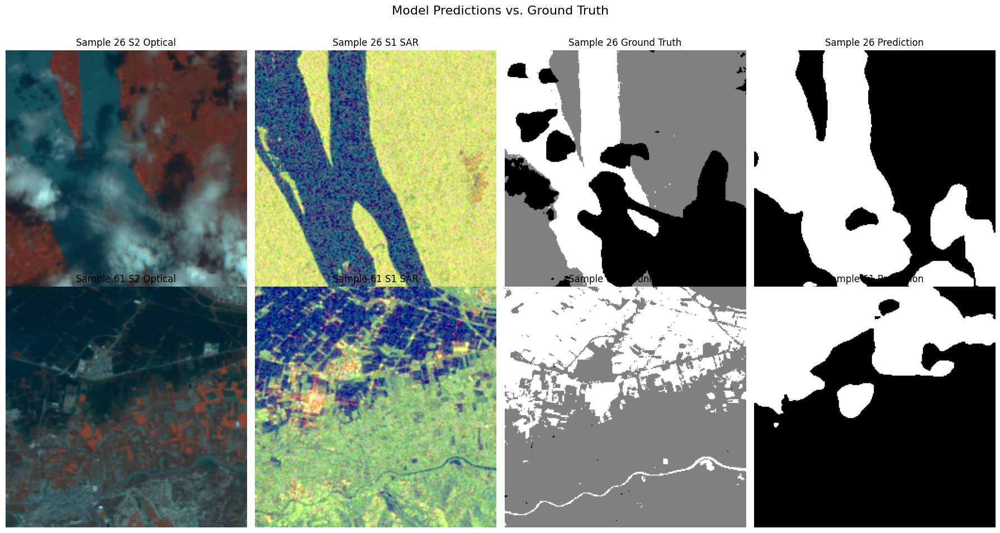

In [ ]:
dofa_iou = evaluate_model(dofa_model, val_dataloader, "cuda")
print(f"DOFA IoU: {dofa_iou:.4f}")

plot_prediction_examples(dofa_model, val_dataset, "cuda")

In [ ]:
# Purge the VRAM
import gc
del dofa_model
gc.collect()
torch.cuda.empty_cache()
print(f"DOFA deleted. allocated VRAM : {torch.cuda.memory_allocated()/1e9:.2f} GB")

DOFA deleted. allocated VRAM : 0.56 GB


## SkySense: A Multi-Modal Remote Sensing Foundation Model

**SkySense** (Guo et al., CVPR 2024) is one of the largest multi-modal Remote Sensing Foundation Model (RSFM) to date, totaling around 2b parameters. It is composed of 3 different encoders: A ViT-Large (\~300M parameters) for encoding S2 data, another ViT-Large for encoding S1 data, and a Swin-Huge (\~650M parameters) for encoding VHR data.

In this practical, we use **both SkySense ViT-Large encoders simultaneously**:
- **S2 encoder** — ViT-Large with `in_channels=10`, fed the 10 standard Sentinel-2 bands (B2, B3, B4, B5, B6, B7, B8, B8A, B11, B12) selected from the 13-band input.
- **S1 encoder** — the same ViT-Large architecture, with the S1-pretrained weights, fed the 2 Sentinel-1 GRD bands (VV, VH).

The 4 feature maps from each encoder are concatenated channel-wise (1024 + 1024 = 2048 channels per scale), then decoded by the UperNet decoder.

In [ ]:
# Check for RSFM backbone weights and prompt user to download if not found
import os

S2_WEIGHTS_PATH = "pretrained_models/skysense_model_backbone_s2.pth"
S1_WEIGHTS_PATH = "pretrained_models/skysense_model_backbone_s1.pth"

if not os.path.exists(S2_WEIGHTS_PATH) or not os.path.exists(S1_WEIGHTS_PATH):
    print("Weights not found. Download from:")
    print("  https://www.notion.so/SkySense-Checkpoints-a7fcff6ce29a4647a08c7fe416910509")
    print(f"Then place the files at: {S2_WEIGHTS_PATH} and {S1_WEIGHTS_PATH}")
else:
    print("Weights found:", S2_WEIGHTS_PATH, S1_WEIGHTS_PATH)


Weights found: pretrained_models/skysense_model_backbone_s2.pth pretrained_models/skysense_model_backbone_s1.pth


In [ ]:
# Definition of the SkySense wrapper with the shared UperNet decoder head.
import os
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F

_skysense_path = os.path.abspath("./src/SkySense")
if _skysense_path not in sys.path:
    sys.path.insert(0, _skysense_path)

from models.vision_transformer import VisionTransformer

# SkySense ViT-Large expects exactly these 10 Sentinel-2 bands (same as in
# the official README: B2, B3, B4, B5, B6, B7, B8, B8A, B11, B12).
# We select them directly from the 13-band S2L1C tensor — no linear projection.
_S2_13 = ["B1", "B2", "B3", "B4", "B5", "B6", "B7", "B8", "B8A", "B9", "B10", "B11", "B12"]
SKYSENSE_BAND_IDX = [_S2_13.index(b) for b in ["B2", "B3", "B4", "B5", "B6", "B7", "B8", "B8A", "B11", "B12"]]


def _load_skysense_backbone(weights_path: str, in_channels: int, out_indices=(5, 11, 17, 23)) -> VisionTransformer:
    """Instantiate and load a SkySense ViT-Large backbone.

    Both the S2 encoder (in_channels=10) and the S1 encoder (in_channels=2)
    share the same ViT-Large architecture and checkpoint (loaded strict=False).
    The transformer layers, cls_token and pos_embed are fully shared.
    The first ``patch_embed.projection`` Conv2d differs in input channels:
    when the saved weight shape does not match (S1 case), that key is excluded
    so the layer stays randomly initialised and is learned from data.
    """
    backbone = VisionTransformer(
        img_size=64,
        patch_size=4,
        in_channels=in_channels,
        embed_dims=1024,
        num_layers=24,
        num_heads=16,
        out_indices=out_indices,
    )
    checkpoint = torch.load(weights_path, map_location="cpu")
    # Strip 'backbone.' prefix if present (segmentation/detection style ckpt)
    ckpt = {k.replace("backbone.", ""): v for k, v in checkpoint.items() if "backbone" in k}
    if not ckpt:
        ckpt = checkpoint

    # Drop any weight whose shape conflicts with the current model
    # (in practice: patch_embed.projection.weight when in_channels ≠ 10)
    model_state = backbone.state_dict()
    ckpt_filtered = {k: v for k, v in ckpt.items()
                     if k in model_state and model_state[k].shape == v.shape}
    skipped = [k for k in ckpt if k not in ckpt_filtered]

    msg = backbone.load_state_dict(ckpt_filtered, strict=False)
    print(f"[SkySense in_channels={in_channels}] "
          f"loaded={len(ckpt_filtered)}, skipped={skipped}, "
          f"missing={len(msg.missing_keys)}")
    return backbone


class SkySenseSegWrapper(nn.Module):
    """SkySense dual-encoder (S2 + S1) + shared MultiScale UperNet head.

    Architecture (per the official SkySense README / CVPR 2024 paper):
      • S2 encoder  — ViT-Large, in_channels=10 (B2 B3 B4 B5 B6 B7 B8 B8A B11 B12)
      • S1 encoder  — same ViT-Large, in_channels=2  (VV, VH)
      Both are loaded from the same pretrained checkpoint.
      The shared transformer weights (layers, cls_token, pos_embed) load
      exactly; only the first patch_embed Conv2d differs between S1 and S2,
      so that layer is left randomly initialised for the S1 encoder and learned
      during fine-tuning.

    Feature fusion: the 4 feature maps from each encoder are concatenated
    channel-wise (1024 + 1024 = 2048), then decoded by MultiScaleUperNetHead.

    Band selection: the 10 S2 bands are selected by index from the full 13-band
    Sentinel-2 L1C input — no learnable linear projection is needed.

    img_size = 64: each encoder works on 64×64 crops at native resolution.
    (The full 512×512 validation image is processed by tiled inference.)
    """

    def __init__(self, s2_weights_path: str, s1_weights_path: str, freeze_encoder: bool = True):
        super().__init__()
        self.img_size = 64

        self.backbone_s2 = _load_skysense_backbone(s2_weights_path, in_channels=10)
        self.backbone_s1 = _load_skysense_backbone(s1_weights_path, in_channels=2)

        if freeze_encoder:
            for backbone in (self.backbone_s2, self.backbone_s1):
                for p in backbone.parameters():
                    p.requires_grad_(False)
                backbone.eval()
            # The S1 patch_embed was not pre-trained → keep it trainable
            for p in self.backbone_s1.patch_embed.parameters():
                p.requires_grad_(True)

        # Two encoders each produce 1024-channel feature maps → 2048 combined
        self.decoder = MultiScaleUperNetHead(2048, num_classes=2)

    def _extract_features(self, backbone, x):
        """Run backbone and ensure outputs are (B, C, H, W) spatial maps."""
        outs = backbone(x)
        processed = []
        for feat in outs:
            if feat.dim() == 3:
                # (B, N, C) → (B, C, sqrt(N), sqrt(N))
                B, N, C = feat.shape
                grid = int(N ** 0.5)
                feat = feat.permute(0, 2, 1).reshape(B, C, grid, grid)
            processed.append(feat)
        return processed

    def forward(self, image_dict: dict) -> torch.Tensor:
        s2 = image_dict["optical"]   # (B, 13, H, W)
        s1 = image_dict["sar"]       # (B,  2, H, W)
        _, _, height, width = s2.shape

        # Select the 10 S2 bands expected by SkySense (no learnable projection)
        s2_10 = s2[:, SKYSENSE_BAND_IDX, :, :]

        # Resize both modalities to the backbone's native 64×64 resolution
        s2_64 = F.interpolate(s2_10, size=(64, 64), mode="bilinear", align_corners=False)
        s1_64 = F.interpolate(s1,    size=(64, 64), mode="bilinear", align_corners=False)

        # Encode each modality independently
        feats_s2 = self._extract_features(self.backbone_s2, s2_64)  # 4 × (B, 1024, 16, 16)
        feats_s1 = self._extract_features(self.backbone_s1, s1_64)  # 4 × (B, 1024, 16, 16)

        # Fuse: concatenate S2 and S1 features channel-wise at each scale
        fused = [torch.cat([f2, f1], dim=1) for f2, f1 in zip(feats_s2, feats_s1)]  # 4 × (B, 2048, 16, 16)

        logits = self.decoder(fused)
        if logits.shape[-2:] != (height, width):
            logits = F.interpolate(logits, size=(height, width), mode="bilinear", align_corners=False)
        return logits


/usr/local/lib/python3.12/dist-packages/mmcv/cnn/bricks/transformer.py:33: UserWarning: Fail to import ``MultiScaleDeformableAttention`` from ``mmcv.ops.multi_scale_deform_attn``, You should install ``mmcv`` rather than ``mmcv-lite`` if you need this module. 
  warnings.warn('Fail to import ``MultiScaleDeformableAttention`` from '


In [ ]:
# instantiate the model. you can use the S2_WEIGHTS_PATH and S1_WEIGHTS_PATH variables
skysense_model = SkySenseSegWrapper(s2_weights_path=S2_WEIGHTS_PATH, s1_weights_path=S1_WEIGHTS_PATH)

print(number_of_parameters(skysense_model))

[SkySense in_channels=10] loaded=292, skipped=[], missing=0
[SkySense in_channels=2] loaded=292, skipped=[], missing=0
Trainable: 32,026,114 / 637,338,114 (5.0%)


In [ ]:
# train for 6 epochs
skysense_history = train_model_on_sen1floods11(skysense_model, n_epochs=6)

Training with random 64×64 crops (model native resolution). Evaluation uses tiled inference.
Class Distribution: [0.905, 0.095]
Starting training on cuda...
Epoch 0 (before training) — mIoU: 5.59%


Epoch 1: 100%|██████████| 32/32 [01:41<00:00,  3.18s/it, loss=0.3911]

Epoch 1 — mIoU: 55.31%



Epoch 2: 100%|██████████| 32/32 [01:40<00:00,  3.16s/it, loss=0.3404]

Epoch 2 — mIoU: 70.00%



Epoch 3: 100%|██████████| 32/32 [01:40<00:00,  3.14s/it, loss=0.1761]

Epoch 3 — mIoU: 76.92%
Epoch 4: reducing learning rate to 1.0e-05



Epoch 4: 100%|██████████| 32/32 [01:39<00:00,  3.12s/it, loss=0.1691]

Epoch 4 — mIoU: 78.43%



Epoch 5: 100%|██████████| 32/32 [01:40<00:00,  3.13s/it, loss=0.1214]

Epoch 5 — mIoU: 79.69%



Epoch 6: 100%|██████████| 32/32 [01:39<00:00,  3.12s/it, loss=0.1330]

Epoch 6 — mIoU: 81.97%


In [ ]:
# The following evaluation may take several minutes due to tiled inference on the full 256x256 images with a large ViT backbone.

# skysense_iou = evaluate_model(skysense_model, val_dataloader, "cuda")
# print(f"SkySense IoU: {skysense_iou:.4f}")
# typical mIoU: ~0.75

Running tiled inference for sample 26 with tile size 64...
Running tiled inference for sample 61 with tile size 64...


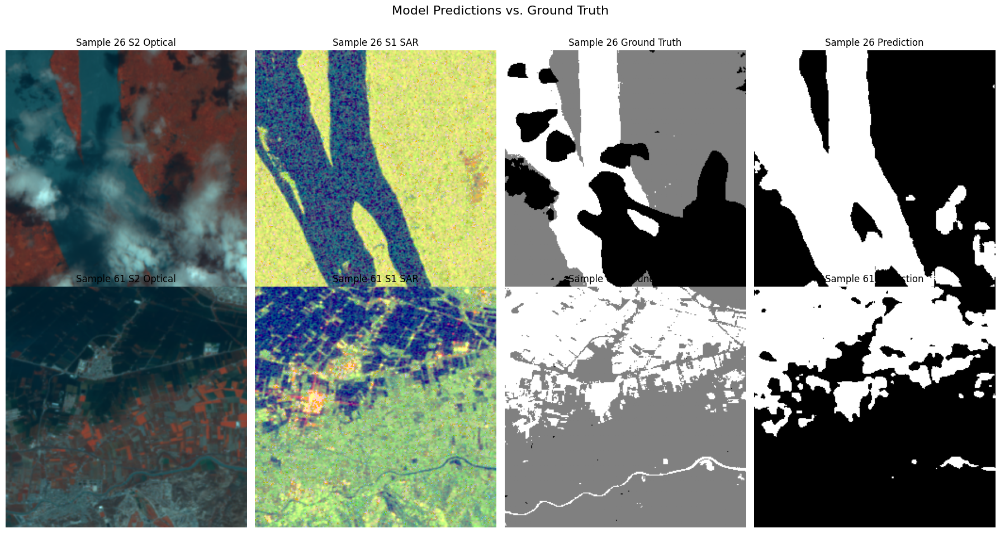

In [ ]:
plot_prediction_examples(skysense_model, val_dataset, "cuda")

In [ ]:
# Purge the VRAM
import gc
del skysense_model
gc.collect()
torch.cuda.empty_cache()
print(f"SkySense supprimé. VRAM allouée : {torch.cuda.memory_allocated()/1e9:.2f} GB")

SkySense supprimé. VRAM allouée : 0.57 GB


# Comparisons

In [ ]:
# plot the training histories of all models for comparison

...

Ellipsis

Example code below if you need help !

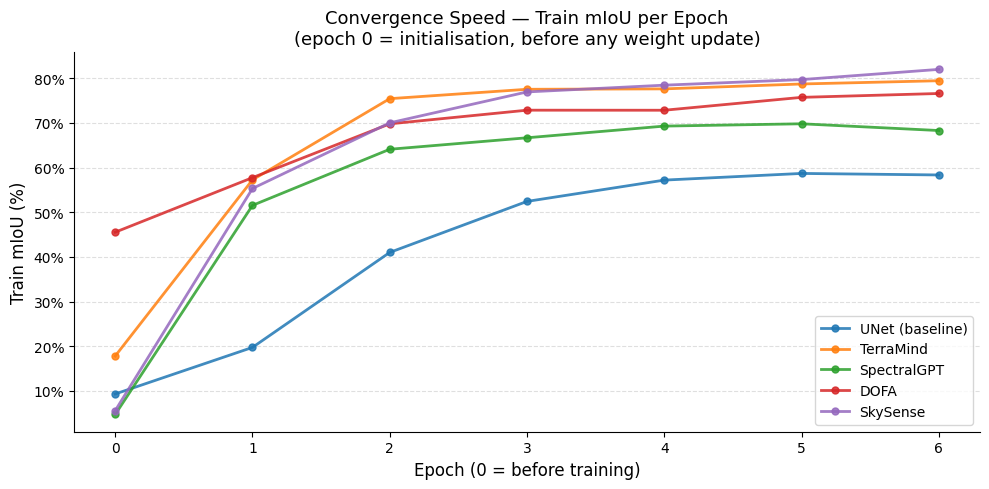

📈 Convergence curves saved as rsfm_convergence_curves.png


In [ ]:
# @title
# ============================================================
# CONVERGENCE CURVES — Train mIoU vs. Epoch
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

_histories = {
    "UNet (baseline)":     globals().get("unet_history"),
    "TerraMind":           globals().get("terramind_history"),
    "SpectralGPT":         globals().get("spectral_gpt_history"),
    "DOFA":                globals().get("dofa_history"),
    "SkySense":            globals().get("skysense_history"),
}
_histories = {k: v for k, v in _histories.items() if v}  # drop untrained models

if not _histories:
    print("No training history found. Run the model training cells first.")
else:
    fig, ax = plt.subplots(figsize=(10, 5))
    colors = plt.cm.tab10.colors

    for idx, (name, history) in enumerate(_histories.items()):
        epochs, mious = zip(*history)
        ax.plot(epochs, [m * 100 for m in mious],
                label=name, color=colors[idx % len(colors)],
                linewidth=2, marker="o", markersize=5, alpha=0.85)

    ax.set_xlabel("Epoch (0 = before training)", fontsize=12)
    ax.set_ylabel("Train mIoU (%)", fontsize=12)
    ax.set_title("Convergence Speed — Train mIoU per Epoch\n(epoch 0 = initialisation, before any weight update)", fontsize=13)
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.0f%%"))
    ax.xaxis.set_major_locator(mticker.MaxNLocator(integer=True))
    ax.legend(fontsize=10, loc="lower right")
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.savefig("rsfm_convergence_curves.png", dpi=150)
    plt.show()
    print("📈 Convergence curves saved as rsfm_convergence_curves.png")


Compare with your own charts, is the conclusion the same ?

# To go further

 - Find some examples where the models fail (far from the ground truth) and plot the predictions to analyze the reasons.
 - Add another RSFM, by finding it online and following the usage instructions (typically in the GitHub README.md). for example AnySat !
 - Tweak the training to obtain better results:
   - Change the learning rate
   - Change the batch size
   - Train for longer
   - Use a smarter LR scheduler
   - Modify the decoder (e.g. less channels)

In [ ]:
...